In [1]:
import osmnx as ox
# get the building footprints in Macclesfield
place = "Landkreis Breisgau-Hochschwarzwald"
#tags = {'building': 'school'}
# Ebene Landkreis
tags = {'admin_level': '6'}
#gdf = ox.geometries_from_place(place, tags)

#tags = {'boundary': 'administrative'}   

bh_osmid='R1946367'
lk_bh=ox.geocode_to_gdf(bh_osmid, by_osmid=True)
lk_bh_poly=lk_bh.geometry[0]

<Axes: >

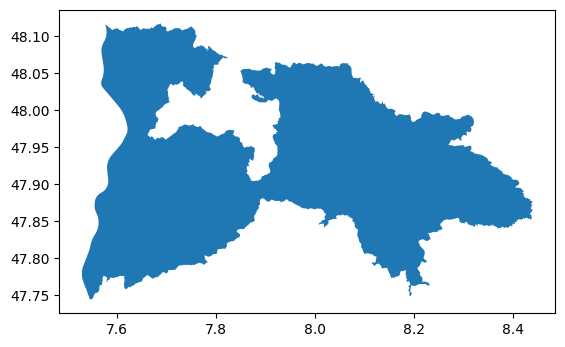

In [2]:
lk_bh.plot()

In [3]:
# Ebene Gemeinde
tags = {'admin_level': '8'}
gdf =ox.features.features_from_polygon(lk_bh_poly,tags)

In [4]:
in_bh=gdf.within(lk_bh_poly)

In [5]:
gem_in_bh_gdf=gdf[in_bh & (gdf['name'].notnull()) & (gdf['type'] == 'boundary') ]  

In [6]:
import json
with open('schulen.json') as f:
    x = json.load(f)

#sc=json.read_file('schulen.json')
#x = json.loads(sc)

In [7]:
#in_bh_gdf.plot()
tags = {'boundary': 'administrative'}
gem_bh_gdf =ox.features.features_from_polygon(lk_bh_poly,tags)

In [8]:
in_bh=gem_bh_gdf.within(lk_bh_poly)
ort_in_bh_gdf=gem_bh_gdf[in_bh & (gem_bh_gdf['name'].notnull()) & (gem_bh_gdf['type'] == 'boundary') & gem_bh_gdf['de:regionalschluessel'].isnull()] 


In [10]:
ort_in_bh_gdf

geometry  \
element_type osmid                                                        
relation     68452    POLYGON ((7.72741 47.94288, 7.72512 47.94628, ...   
             68453    POLYGON ((7.71759 47.94234, 7.71763 47.94235, ...   
             68458    POLYGON ((7.76723 47.92474, 7.76732 47.92476, ...   
             68460    POLYGON ((7.84037 47.92086, 7.84154 47.92111, ...   
             68467    POLYGON ((7.72214 47.90799, 7.7222 47.908, 7.7...   
...                                                                 ...   
             1946222  MULTIPOLYGON (((7.7114 47.92558, 7.71138 47.92...   
             1954584  POLYGON ((7.78263 48.08025, 7.78266 48.08024, ...   
             1954585  POLYGON ((7.76757 48.04437, 7.76865 48.04656, ...   
             1954586  POLYGON ((7.74439 48.06466, 7.74446 48.06488, ...   
             1970193  MULTIPOLYGON (((7.85037 48.05136, 7.8504 48.05...   

                     source admin_level contact:website  \
element_type osmid                                        
relation     68452      NaN           9             NaN   
             68453      NaN           9             NaN   
             68458      NaN          10             NaN   
             68460      NaN          10             NaN   
             68467      NaN          10             NaN   
...                     ...         ...             ...   
             1946222    NaN          10             NaN   
             1954584    NaN           9             NaN   
             1954585    NaN           9             NaN   
             1954586    NaN           9             NaN   
             1970193    NaN          10             NaN   

                                       name name:af name:am name:an name:ar  \
element_type osmid                                                            
relation     68452              Scherzingen     NaN     NaN     NaN     NaN   
             68453                Norsingen     NaN     NaN     NaN     NaN   
             68458    Bollschweil (Kernort)     NaN     NaN     NaN     NaN   
             68460               St. Ulrich     NaN     NaN     NaN     NaN   
             68467             Ehrenstetten     NaN     NaN     NaN     NaN   
...                                     ...     ...     ...     ...     ...   
             1946222             Kirchhofen     NaN     NaN     NaN     NaN   
             1954584             Holzhausen     NaN     NaN     NaN     NaN   
             1954585             Hugstetten     NaN     NaN     NaN     NaN   
             1954586           Neuershausen     NaN     NaN     NaN     NaN   
             1970193           Gundelfingen     NaN     NaN     NaN     NaN   

                     name:arc  ... alt_name:zh-Hant euro_const name:ja-Hira  \
element_type osmid             ...                                            
relation     68452        NaN  ...              NaN        NaN          NaN   
             68453        NaN  ...              NaN        NaN          NaN   
             68458        NaN  ...              NaN        NaN          NaN   
             68460        NaN  ...              NaN        NaN          NaN   
             68467        NaN  ...              NaN        NaN          NaN   
...                       ...  ...              ...        ...          ...   
             1946222      NaN  ...              NaN        NaN          NaN   
             1954584      NaN  ...              NaN        NaN          NaN   
             1954585      NaN  ...              NaN        NaN          NaN   
             1954586      NaN  ...              NaN        NaN          NaN   
             1970193      NaN  ...              NaN        NaN          NaN   

                     name:sje official_name:ja short_name:ja  \
element_type osmid                                             
relation     68452        NaN              NaN           NaN   
             68453        NaN              NaN           NaN   
       

In [11]:
network_type = "walk"
trip_times = [5, 10, 15, 20, 25,30,40]  # in minutes
travel_speed = 3  # walking speed in km/hour
tags = {'building': True}   

# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap="plasma", start=0)

lk_bh_walk=ox.graph_from_polygon(lk_bh_poly,network_type=network_type)
lk_bh_build=ox.features_from_polygon(lk_bh_poly,tags)

# add an edge attribute for time in minutes required to traverse each edge
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute
for _, _, _, data in lk_bh_walk.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

In [23]:
lk_bh_walk.size()

210668

In [18]:
lk_bh_walk[456383]

AdjacencyView({456385: {0: {'osmid': 75870926, 'oneway': False, 'highway': 'service', 'reversed': False, 'length': 51.724999999999994, 'geometry': <LINESTRING (7.721 47.971, 7.721 47.971, 7.721 47.971, 7.721 47.971, 7.722 4...>, 'time': 1.0345}}, 895593695: {0: {'osmid': 75870943, 'oneway': False, 'highway': 'service', 'service': 'parking_aisle', 'reversed': True, 'length': 25.047, 'geometry': <LINESTRING (7.721 47.971, 7.721 47.971, 7.722 47.971, 7.722 47.971, 7.722 4...>, 'time': 0.50094}}})

In [ ]:
eki_buildings=ox.truncate.truncate_graph_polygon(lk_bh_build,poly)
figure, axes = ox.plot_graph(
    G,
    ax=axe,
    node_color=nc,
    node_size=ns,
    node_alpha=0.8,
    edge_linewidth=0.2,
    edge_color="#999999",
    show=False, 
    close=False
)

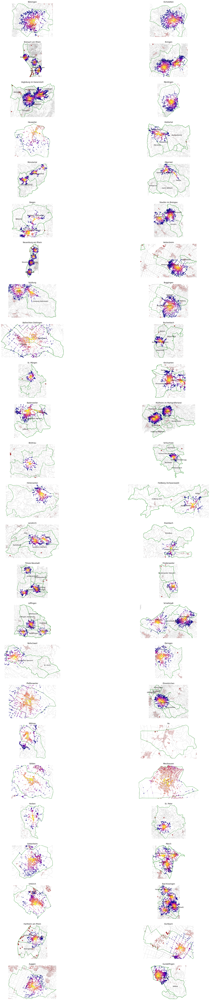

In [44]:
import networkx as nx
from shapely.geometry import Point

br=2
anz=25
fig, axs = plt.subplots(anz,br,figsize=(30, 120))
sw=0

#roads=lk_bh_walk
for index, row in gem_in_bh_gdf.iterrows():
    node_colors = {}
    poly_gem = gpd.GeoSeries(row['geometry'])
    axs[sw//br,sw%br].set_title(row['name'])

    for cur in (x["schools"]):
        p=Point(cur["lng"],cur["lat"])
        if p.within(poly_gem).any(): 
            poi=ox.distance.nearest_nodes(roads, cur["lng"],cur["lat"])
            for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
                subgraph = nx.ego_graph(roads, poi, radius=trip_time, distance="time")
                for node in subgraph.nodes():
                    col_old=0
                    if node in node_colors:
                        col_old=sum(node_colors[node])
                    if sum(color)>col_old:
                        node_colors[node] = color
    
    for idx_orte, row_orte in ort_in_bh_gdf.iterrows():
        poly_ort=row_orte['geometry']
        poly_ort = gpd.GeoSeries(row_orte['geometry'])
        p_center=poly_ort.centroid
        if poly_gem.contains(p_center).any():
            poly_ort.plot(ax=axs[sw//br,sw%br],facecolor='none', edgecolor='green')
            axs[sw//br,sw%br].annotate(text=row_orte["name"], xy=(p_center[0].x,p_center[0].y), horizontalalignment='center')
    lk_bh_build.plot(ax=axs[sw//br,sw%br],color='brown')
    nc = [node_colors[node] if node in node_colors else "none" for node in roads.nodes()]
    ns = [15 if node in node_colors else 0 for node in roads.nodes()]
    poly_gem.plot(ax=axs[sw//br,sw%br],facecolor='none', edgecolor='green')
    fig, ax = ox.plot_graph(
        roads,
        ax=axs[sw//br,sw%br],
        node_color=nc,
        node_size=ns,
        node_alpha=0.8,
        edge_linewidth=0.2,
        edge_color="#999999",
        show=False, 
        close=False
    )
    
    axs[sw//br,sw%br].set_ylim(poly_gem.bounds["miny"][0],poly_gem.bounds["maxy"][0])
    axs[sw//br,sw%br].set_xlim(poly_gem.bounds["minx"][0],poly_gem.bounds["maxx"][0])
    sw+=1
    if sw>3:
        break
plt.show()

NameError: name 'gem_in_bh_gdf' is not defined

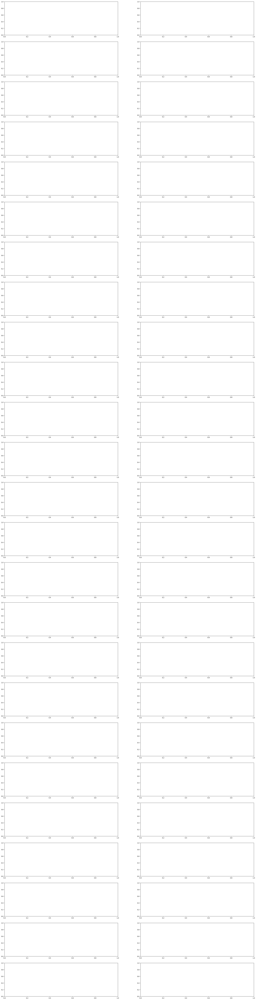

In [2]:
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
import shapely
from shapely import LineString, MultiPoint, Polygon, Point, MultiPolygon
br=2
anz=25
fig, axs = plt.subplots(anz,br,figsize=(30, 120))
sw=0
for index, row in gem_in_bh_gdf.iterrows():
    roads=lk_bh_walk
    if row['name'] == 'Ehrenkirchen':
        axs[sw//br,sw%br].set_title(row['name'])
        poly = gpd.GeoSeries(row['geometry'])
        #for idx_build, row_build in lk_bh_build.iterrows():
        #    poly_build=gpd.GeoSeries(row_build['geometry'])
        #    if poly.contains(poly_build.centroid).any():
        #        poly_build.plot(ax=axs[sw//br,sw%br],color='brown')
        #for idx_orte, row_orte in ort_in_bh_gdf.iterrows():
        #    poly_ort=row_orte['geometry']
        #    poly_ort = gpd.GeoSeries(row_orte['geometry'])
        #    p_center=poly_ort.centroid
        #    if poly.contains(p_center).any():
        #        poly_ort.plot(ax=axs[sw//br,sw%br],color='white', edgecolor='green')
        #        axs[sw//br,sw%br].annotate(text=row_orte["name"], xy=(p_center[0].x,p_center[0].y), horizontalalignment='center')
        
        roads=ox.truncate.truncate_graph_polygon(lk_bh_walk,poly)
        fig, ax = ox.plot_graph(
            roads,
            ax=axs[sw//br,sw%br],
            node_color=nc,
            node_size=ns,
            node_alpha=0.8,
            edge_linewidth=0.2,
            edge_color="#999999",
            show=False, 
            close=False
        )        

        
        poly.plot(ax=axs[sw//br,sw%br],facecolor='none', edgecolor='black')
        
        sw+=1
plt.show()    

In [40]:
type(lk_bh_build)

geopandas.geodataframe.GeoDataFrame

In [43]:
type(node_colors)

dict

In [15]:
dir(p_center)

NameError: name 'p_center' is not defined

In [ ]:
p_center[0].x

In [60]:
type(roads)

networkx.classes.multidigraph.MultiDiGraph

In [53]:
#roads=ox.truncate.truncate_graph_bbox(lk_bh_walk,bbox=(poly.bounds["minx"][0],poly.bounds["miny"][0],poly.bounds["maxx"][0],poly.bounds["maxy"][0]),truncate_by_edge=False,retain_all=True)
#roads=ox.truncate.truncate_graph_bbox(lk_bh_walk,bbox=(7.4,48,7.8,48.1),truncate_by_edge=False,retain_all=True)
roads=ox.truncate.truncate_graph_polygon(lk_bh_walk,poly)
node_colors = {}
nc = [node_colors[node] if node in node_colors else "none" for node in roads.nodes()]
ns = [15 if node in node_colors else 0 for node in roads.nodes()]
fig, ax = ox.plot_graph(
    roads,
    node_color=nc,
    node_size=ns,
    node_alpha=0.8,
    edge_linewidth=0.2,
    edge_color="#999999",
    show=False, 
    close=False
)

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [51]:
(roads.size(),lk_bh_walk.size())

(67870, 210668)

In [52]:
(poly.bounds["minx"][0],poly.bounds["miny"][0],poly.bounds["maxx"][0],poly.bounds["maxy"][0])

(7.6112185, 48.0284124, 7.7075655, 48.0845314)

In [64]:
build_tr=lk_bh_build.within(poly)

C:\Users\tstrub\AppData\Local\Temp\ipykernel_16448\1811703555.py:1: UserWarning: The indices of the left and right GeoSeries' are not equal, and therefore they will be aligned (reordering and/or introducing missing values) before executing the operation. If this alignment is the desired behaviour, you can silence this warning by passing 'align=True'. If you don't want alignment and protect yourself of accidentally aligning, you can pass 'align=False'.
  build_tr=lk_bh_build.within(poly)


ValueError: cannot join with no overlapping index names

In [62]:
lk_bh_build

entrance  \
element_type osmid                
node         290711483      NaN   
             291770511      NaN   
             302241673      NaN   
             311774360      NaN   
             313013688      NaN   
...                         ...   
relation     13641767       NaN   
             13641768       NaN   
             14520585       NaN   
             16403955       NaN   
             17355420       NaN   

                                                                 geometry  \
element_type osmid                                                          
node         290711483                           POINT (7.68643 48.04852)   
             291770511                           POINT (8.03423 48.01718)   
             302241673                            POINT (8.10529 47.9058)   
             311774360                           POINT (8.00636 48.03735)   
             313013688                           POINT (8.02205 48.00574)   
...                                                                   ...   
relation     13641767   POLYGON ((7.85583 47.94669, 7.85594 47.94671, ...   
             13641768   POLYGON ((7.85583 47.94669, 7.85594 47.94671, ...   
             14520585   POLYGON ((7.69948 47.90954, 7.69982 47.9093, 7...   
             16403955   MULTIPOLYGON (((7.8804 48.04553, 7.88045 48.04...   
             17355420   MULTIPOLYGON (((7.68965 47.91927, 7.68979 47.9...   

                       amenity  \
element_type osmid               
node         290711483     NaN   
             291770511     NaN   
             302241673     NaN   
             311774360     NaN   
             313013688     NaN   
...                        ...   
relation     13641767      NaN   
             13641768      NaN   
             14520585      NaN   
             16403955      NaN   
             17355420      NaN   

                                                              description  \
element_type osmid                                                          
node         290711483                                                NaN   
             291770511                                                NaN   
             302241673                     Hotelverzeichniss / hotel list   
             311774360                                                NaN   
             313013688                                                NaN   
...                                                                   ...   
relation     13641767                                                 NaN   
             13641768                                                 NaN   
             14520585                                                 NaN   
             16403955   Naturkindergarten für 40 Kinder zwischen 3 und...   
             17355420                                                 NaN   

                                             operator operator:wikidata  \
element_type osmid                                                        
node         290711483                            NaN               NaN   
             291770511                            NaN               NaN   
             302241673                            NaN               NaN   
             311774360                            NaN               NaN   
             313013688                            NaN               NaN   
...                                               ...               ...   
relation     13641767                             NaN               NaN   
             13641768                             NaN               NaN   
             14520585                             NaN               NaN   
             16403955   Jugendhilfswerk Freiburg e.V.               NaN   
             17355420                             NaN               NaN   

                              building                         name  \
element_type osmid                                                    
no